# Computer Vision Basics

## SETUP & ENVIRONMENT

### Installation & Imports

In [ ]:
# Install required libraries (run once)
!pip install opencv-python numpy matplotlib scikit-image

# Import all necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

# Check versions
print("OpenCV Version:", cv2.__version__)
print("NumPy Version:", np.__version__)
print("Matplotlib Version:", plt.matplotlib.__version__)

OpenCV Version: 4.12.0
NumPy Version: 2.0.2
Matplotlib Version: 3.10.0


### Helper Functions


    Display a single image with proper handling for BGR/RGB conversion
    
    Parameters:
    -----------
    title : str
        Title of the plot
    img : ndarray
        Image to display (BGR for OpenCV images)
    figsize : tuple
        Figure size (width, height)
    cmap : str
        Colormap for grayscale images
    

In [ ]:
# ========== HELPER FUNCTIONS FOR VISUALIZATION ==========

def show_image(title, img, figsize=(8, 6), cmap=None):

    plt.figure(figsize=figsize)

    # Convert BGR to RGB if it's a color image
    if len(img.shape) == 3 and img.shape[2] == 3:
        img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        img_display = img

    plt.imshow(img_display, cmap=cmap)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    Display multiple images side by side for comparison
    
    Parameters:
    -----------
    title : str
        Main title for the figure
    images : list
        List of images to display
    labels : list
        List of labels for each image
    figsize : tuple
        Figure size (width, height)

In [ ]:
def show_images_comparison(title, images, labels, figsize=(15, 5)):

    n_images = len(images)
    fig, axs = plt.subplots(1, n_images, figsize=figsize)

    if n_images == 1:
        axs = [axs]

    fig.suptitle(title, fontsize=16, fontweight='bold')

    for idx, (ax, img, label) in enumerate(zip(axs, images, labels)):
        # Convert BGR to RGB if needed
        if len(img.shape) == 3 and img.shape[2] == 3:
            img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img_display = img

        ax.imshow(img_display, cmap='gray' if len(img_display.shape) == 2 else None)
        ax.set_title(label, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Print detailed information about an image
    
    Parameters:
    -----------
    img : ndarray
        Image to analyze
    name : str
        Name of the image for display

In [ ]:
def print_image_info(img, name="Image"):
    print(f"\n{'='*50}")
    print(f"IMAGE INFORMATION: {name}")
    print(f"{'='*50}")
    print(f"Shape (Height, Width, Channels): {img.shape}")
    print(f"Data Type: {img.dtype}")
    print(f"Min Pixel Value: {img.min()}")
    print(f"Max Pixel Value: {img.max()}")
    print(f"Mean Pixel Value: {img.mean():.2f}")
    print(f"Memory Size: {img.nbytes / 1024:.2f} KB")
    print(f"{'='*50}\n")

---

## PART 1: IMAGE FUNDAMENTALS

### Theory: What is a Digital Image?

THEORY: DIGITAL IMAGES AS MATRICES

A digital image is fundamentally a 2D or 3D matrix of pixel values:

1. GRAYSCALE IMAGE:
   - 2D Matrix (Height × Width)
   - Each pixel = 1 value (0-255): intensity/brightness
   - Pixel value 0 = black, 255 = white
   
   Example:
   [[100, 150, 120],
    [110, 160, 125],
    [105, 155, 122]]

2. COLOR IMAGE (RGB/BGR):
   - 3D Matrix (Height × Width × 3 channels)
   - Each pixel = 3 values: Blue, Green, Red (BGR in OpenCV)
   - Each channel ranges from 0-255
   
   Example RGB pixel [255, 0, 0] in BGR = pure red
   Example RGB pixel [0, 255, 0] in BGR = pure green
   Example RGB pixel [0, 0, 255] in BGR = pure blue

3. COORDINATE SYSTEM:
   - Origin (0, 0) is at TOP-LEFT
   - X-axis: increases going RIGHT
   - Y-axis: increases going DOWN
   

4. DATA TYPE:
   - Usually uint8: values 0-255 (most common)
   - Can be float32: values 0.0-1.0 or 0.0-255.0

Creating images from scratch to understand structure:

5x5 Grayscale Matrix:
[[100 120 150 140 130]
 [110 125 160 145 135]
 [105 130 170 155 140]
 [115 135 165 160 145]
 [120 140 155 150 150]]
Shape: (5, 5) (Height, Width)
Data Type: uint8


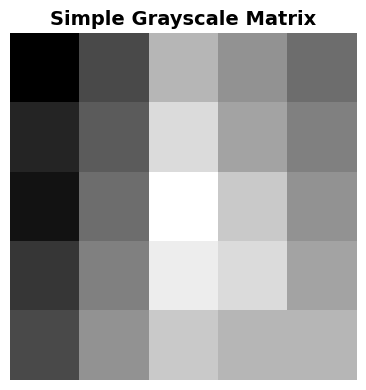

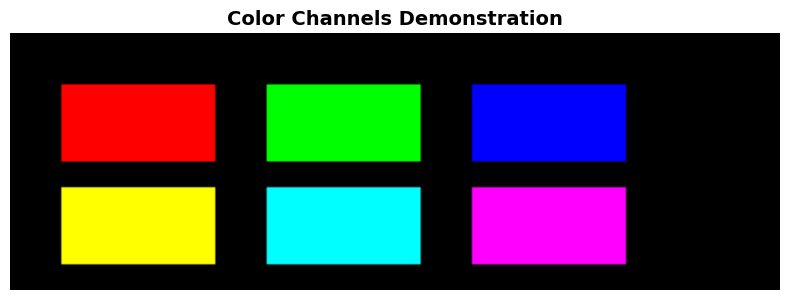


IMAGE INFORMATION: Color Image
Shape (Height, Width, Channels): (100, 300, 3)
Data Type: uint8
Min Pixel Value: 0
Max Pixel Value: 255
Mean Pixel Value: 45.90
Memory Size: 87.89 KB



In [ ]:
# Create a simple image from scratch to understand the structure
print("Creating images from scratch to understand structure:\n")

# 1. Simple 5x5 Grayscale Image
gray_matrix = np.array([
    [100, 120, 150, 140, 130],
    [110, 125, 160, 145, 135],
    [105, 130, 170, 155, 140],
    [115, 135, 165, 160, 145],
    [120, 140, 155, 150, 150]
], dtype=np.uint8)

print("5x5 Grayscale Matrix:")
print(gray_matrix)
print(f"Shape: {gray_matrix.shape} (Height, Width)")
print(f"Data Type: {gray_matrix.dtype}")

# Display it
show_image("Simple Grayscale Matrix", gray_matrix, figsize=(4, 4), cmap='gray')

# 2. Create a color image with patterns
color_image = np.zeros((100, 300, 3), dtype=np.uint8)

# Red square (BGR order!)
color_image[20:50, 20:80] = [0, 0, 255]  # Red in BGR

# Green square
color_image[20:50, 100:160] = [0, 255, 0]  # Green in BGR

# Blue square
color_image[20:50, 180:240] = [255, 0, 0]  # Blue in BGR

# Yellow square (Red + Green in BGR)
color_image[60:90, 20:80] = [0, 255, 255]  # Yellow in BGR

# Cyan square (Green + Blue in BGR)
color_image[60:90, 100:160] = [255, 255, 0]  # Cyan in BGR

# Magenta square (Red + Blue in BGR)
color_image[60:90, 180:240] = [255, 0, 255]  # Magenta in BGR

show_image("Color Channels Demonstration", color_image)
print_image_info(color_image, "Color Image")

### Loading Real Images

Sample Image Loaded Successfully!

IMAGE INFORMATION: Sample Image
Shape (Height, Width, Channels): (300, 400, 3)
Data Type: uint8
Min Pixel Value: 0
Max Pixel Value: 255
Mean Pixel Value: 183.90
Memory Size: 351.56 KB



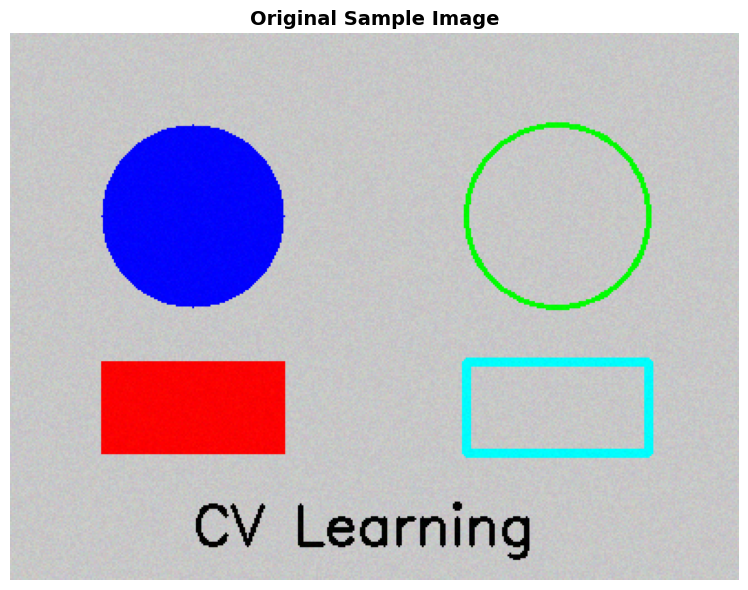


Image Dimensions: 400x300 pixels
Number of Channels: 3
Total Pixels: 120,000


In [ ]:
import cv2
import numpy as np

# Create a sample image for demonstration (if you don't have one)
# You can also use: img = cv2.imread('your_image.jpg')

# For demonstration, let's create a synthetic image
def create_sample_image():
    """Create a sample image with various shapes and patterns"""
    img = np.ones((300, 400, 3), dtype=np.uint8) * 200

    # Draw circles
    cv2.circle(img, (100, 100), 50, (255, 0, 0), -1)  # Blue filled circle
    cv2.circle(img, (300, 100), 50, (0, 255, 0), 2)   # Green circle outline

    # Draw rectangles
    cv2.rectangle(img, (50, 180), (150, 230), (0, 0, 255), -1)  # Red filled rectangle
    cv2.rectangle(img, (250, 180), (350, 230), (255, 255, 0), 3)  # Cyan outline

    # Add text
    cv2.putText(img, 'CV Learning', (100, 280),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

    # Add some noise
    noise = np.random.randint(-10, 10, img.shape)
    # Fix: Convert image to a wider data type (int16) before adding noise
    # to handle negative values, then clip and convert back to uint8.
    img = np.clip(img.astype(np.int16) + noise, 0, 255).astype(np.uint8)

    return img

# Load or create sample image
img = create_sample_image()

print("Sample Image Loaded Successfully!")
print_image_info(img, "Sample Image")
show_image("Original Sample Image", img)

# Get image properties
height, width, channels = img.shape
print(f"\nImage Dimensions: {width}x{height} pixels")
print(f"Number of Channels: {channels}")
print(f"Total Pixels: {height * width:,}")

---

## PART 2: COLOR SPACES & CONVERSIONS

### Theory: Understanding Color Spaces

THEORY: COLOR SPACES

1. BGR vs RGB:
   - OpenCV uses BGR (Blue, Green, Red) by default
   - Most other libraries use RGB (Red, Green, Blue)
   - Matplotlib displays RGB, so conversion needed for display
   
2. GRAYSCALE:
   - Single channel (Y = 0.299R + 0.587G + 0.114B)
   - Uses weighted average because human eye is more sensitive to green
   - Reduces computation and memory by 3x
   
3. HSV (Hue, Saturation, Value):
   - Hue: Color type (0-180 in OpenCV)
   - Saturation: Color intensity (0-255)
   - Value: Brightness (0-255)
   - Better for color-based filtering
   
4. LAB:
   - L: Lightness (0-100)
   - A: Green-Red axis
   - B: Blue-Yellow axis
   - Perceptually uniform, good for object detection

EXTRACTING COLOR CHANNELS

Blue Channel Shape: (300, 400)
Green Channel Shape: (300, 400)
Red Channel Shape: (300, 400)


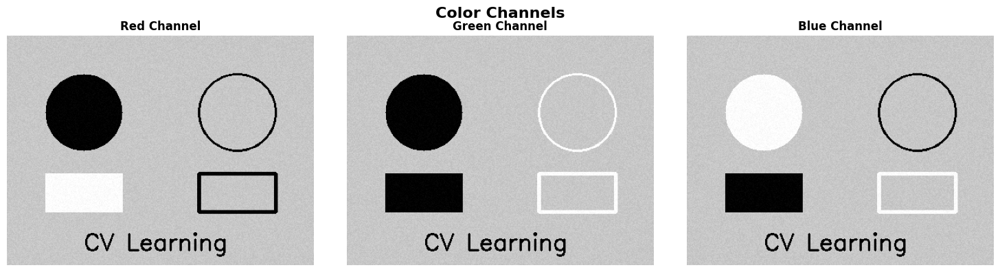


CONVERTING TO GRAYSCALE


IMAGE INFORMATION: Grayscale Image
Shape (Height, Width, Channels): (300, 400)
Data Type: uint8
Min Pixel Value: 0
Max Pixel Value: 209
Mean Pixel Value: 180.54
Memory Size: 117.19 KB



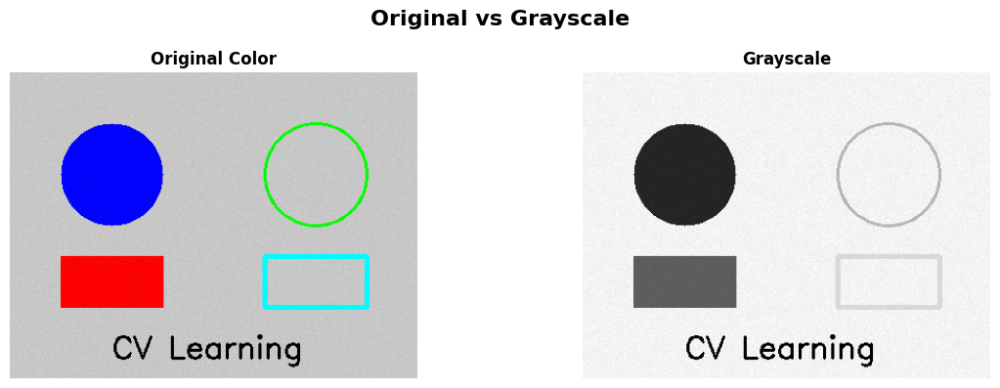


CONVERTING TO HSV



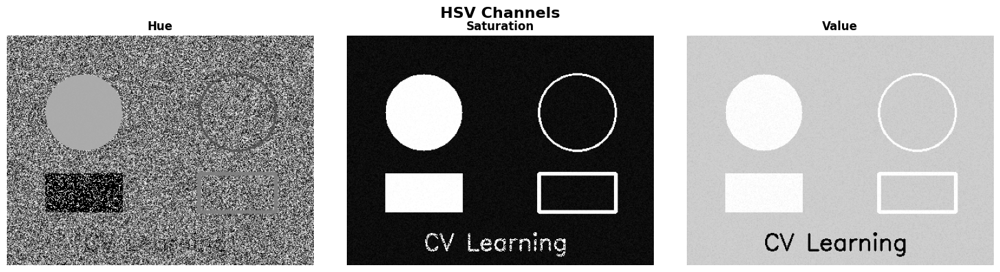


COLOR SPACE COMPARISON



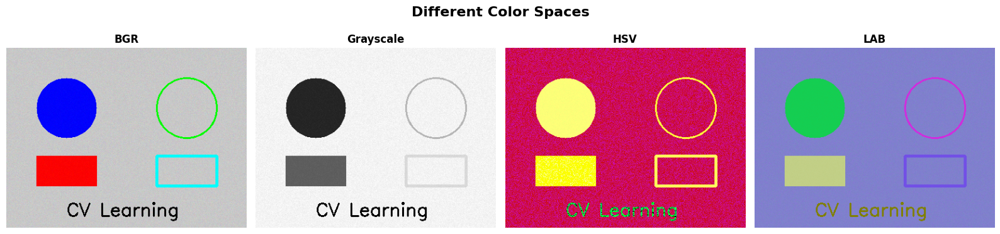

In [ ]:
# 1. Extract and visualize channels
print("EXTRACTING COLOR CHANNELS\n")

# Split image into BGR channels
blue, green, red = cv2.split(img)

print(f"Blue Channel Shape: {blue.shape}")
print(f"Green Channel Shape: {green.shape}")
print(f"Red Channel Shape: {red.shape}")

# Visualize individual channels
show_images_comparison(
    "Color Channels",
    [red, green, blue],
    ["Red Channel", "Green Channel", "Blue Channel"],
    figsize=(15, 4)
)

# 2. Convert to Grayscale
print("\nCONVERTING TO GRAYSCALE\n")

# Method 1: Using cv2.cvtColor (recommended)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print_image_info(gray, "Grayscale Image")

# Display
show_images_comparison(
    "Original vs Grayscale",
    [img, gray],
    ["Original Color", "Grayscale"],
    figsize=(12, 4)
)

# 3. Convert to HSV (Hue, Saturation, Value)
print("\nCONVERTING TO HSV\n")

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

show_images_comparison(
    "HSV Channels",
    [h, s, v],
    ["Hue", "Saturation", "Value"],
    figsize=(15, 4)
)

# 4. Color space comparison
print("\nCOLOR SPACE COMPARISON\n")

lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l, a, b_ch = cv2.split(lab)

show_images_comparison(
    "Different Color Spaces",
    [img, gray, hsv, lab],
    ["BGR", "Grayscale", "HSV", "LAB"],
    figsize=(16, 4)
)

---

## PART 3: FILTERING & SMOOTHING

### Theory: Convolution and Filters

THEORY: IMAGE FILTERING WITH CONVOLUTION

1. CONVOLUTION OPERATION:
   - A filter (kernel) is slid across the image
   - At each position: multiply overlapping values and sum
   - Result: new pixel value at that location
   
   Example 3x3 Kernel:
   [1  2  1]
   [2  4  2]
   [1  2  1]
   
2. COMMON FILTERS:
   
   a) MEAN/AVERAGING FILTER:
      [1/9  1/9  1/9]
      [1/9  1/9  1/9]
      [1/9  1/9  1/9]
      - Simple average of neighborhood
      - Fast but creates blurry edges
      
   b) GAUSSIAN BLUR:
      - Weighted average (center pixels weighted more)
      - More natural looking blur
      - Removes noise while preserving edges better
      
   c) MEDIAN FILTER:
      - Uses median instead of mean
      - Excellent for salt-and-pepper noise
      
3. KERNEL SIZE EFFECT:
   - Larger kernel = more blur/smoothing
   - (3,3) = slight smoothing
   - (7,7) = moderate smoothing
   - (15,15) = heavy smoothing

IMAGE FILTERING & SMOOTHING DEMONSTRATION



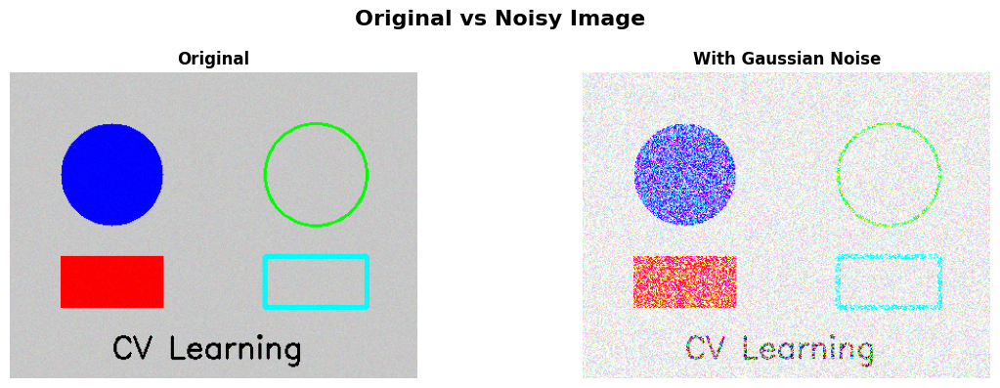

1. AVERAGING BLUR



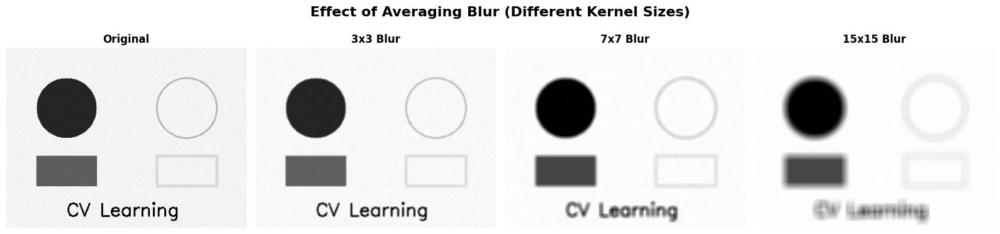

2. GAUSSIAN BLUR



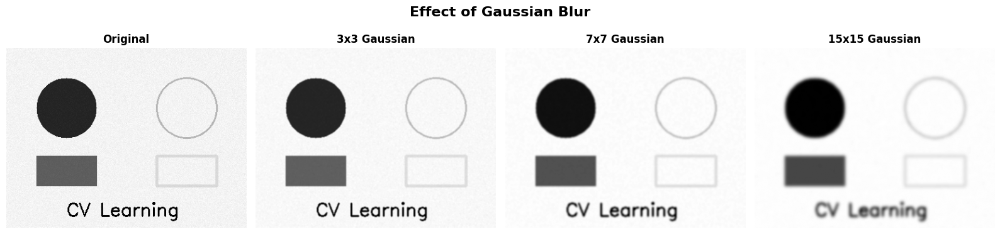

3. MEDIAN BLUR (Best for Salt-and-Pepper Noise)



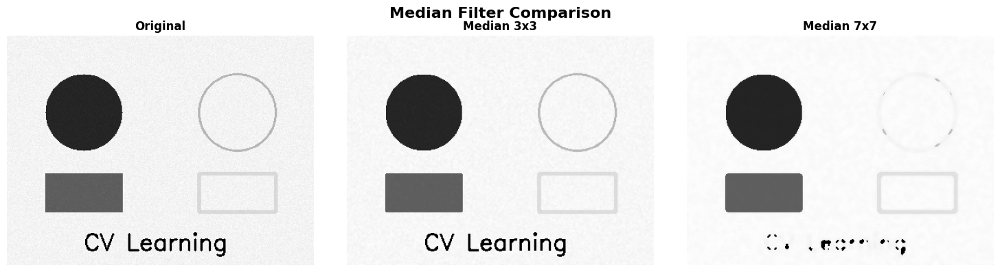

4. BILATERAL FILTER (Preserves Edges)



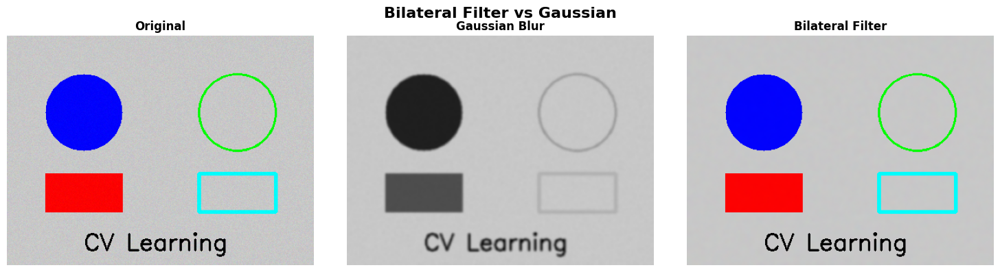


KEY INSIGHTS:
- Gaussian blur: Best all-around smoothing
- Median blur: Best for salt-and-pepper noise
- Bilateral: Preserves edges while smoothing


In [ ]:


print("IMAGE FILTERING & SMOOTHING DEMONSTRATION\n")

# Create image with noise for demonstration
noisy_img = img.copy()
noise = np.random.normal(0, 25, noisy_img.shape).astype(np.uint8)
noisy_img = cv2.add(noisy_img, noise)

show_images_comparison(
    "Original vs Noisy Image",
    [img, noisy_img],
    ["Original", "With Gaussian Noise"],
    figsize=(12, 4)
)

# 1. Mean/Averaging Blur
print("1. AVERAGING BLUR\n")

blur_3 = cv2.blur(gray, (3, 3))    # 3x3 kernel
blur_7 = cv2.blur(gray, (7, 7))    # 7x7 kernel
blur_15 = cv2.blur(gray, (15, 15)) # 15x15 kernel

show_images_comparison(
    "Effect of Averaging Blur (Different Kernel Sizes)",
    [gray, blur_3, blur_7, blur_15],
    ["Original", "3x3 Blur", "7x7 Blur", "15x15 Blur"],
    figsize=(16, 4)
)

# 2. Gaussian Blur (more natural)
print("2. GAUSSIAN BLUR\n")

gauss_3 = cv2.GaussianBlur(gray, (3, 3), 0)
gauss_7 = cv2.GaussianBlur(gray, (7, 7), 0)
gauss_15 = cv2.GaussianBlur(gray, (15, 15), 0)

show_images_comparison(
    "Effect of Gaussian Blur",
    [gray, gauss_3, gauss_7, gauss_15],
    ["Original", "3x3 Gaussian", "7x7 Gaussian", "15x15 Gaussian"],
    figsize=(16, 4)
)

# 3. Median Filter (best for salt-and-pepper noise)
print("3. MEDIAN BLUR (Best for Salt-and-Pepper Noise)\n")

median_3 = cv2.medianBlur(gray, 3)
median_7 = cv2.medianBlur(gray, 7)

show_images_comparison(
    "Median Filter Comparison",
    [gray, median_3, median_7],
    ["Original", "Median 3x3", "Median 7x7"],
    figsize=(15, 4)
)

# 4. Bilateral Filter (preserves edges while smoothing)
print("4. BILATERAL FILTER (Preserves Edges)\n")

bilateral = cv2.bilateralFilter(img, 9, 75, 75)

show_images_comparison(
    "Bilateral Filter vs Gaussian",
    [img, cv2.cvtColor(gauss_7, cv2.COLOR_GRAY2BGR), bilateral],
    ["Original", "Gaussian Blur", "Bilateral Filter"],
    figsize=(15, 4)
)

print("\nKEY INSIGHTS:")
print("- Gaussian blur: Best all-around smoothing")
print("- Median blur: Best for salt-and-pepper noise")
print("- Bilateral: Preserves edges while smoothing")

---

## PART 4: EDGE DETECTION

### Theory: Finding Object Boundaries

THEORY: EDGE DETECTION

1. WHAT ARE EDGES?
   - Rapid changes in pixel intensity
   - Mark boundaries between objects
   - Key feature for object recognition
   
2. SOBEL OPERATOR:
   - Computes image gradients in X and Y directions
   - Sobel X: detects vertical edges
   - Sobel Y: detects horizontal edges
   - Magnitude: sqrt(Gx² + Gy²)
   
3. LAPLACIAN:
   - Second derivative (rate of change of gradient)
   - More sensitive to noise
   - Good for finding rapid transitions
   
4. CANNY EDGE DETECTION (Advanced):
   Step 1: Smooth image (Gaussian blur)
   Step 2: Compute gradients (Sobel)
   Step 3: Non-maximum suppression (thin edges)
   Step 4: Hysteresis thresholding (connect edges)
   
   Parameters:
   - threshold1: Lower threshold
   - threshold2: Upper threshold
   - Pixels > threshold2: definitely edges
   - Pixels < threshold1: not edges
   - threshold1 < pixels < threshold2: edges if connected

EDGE DETECTION METHODS

1. SOBEL EDGE DETECTION



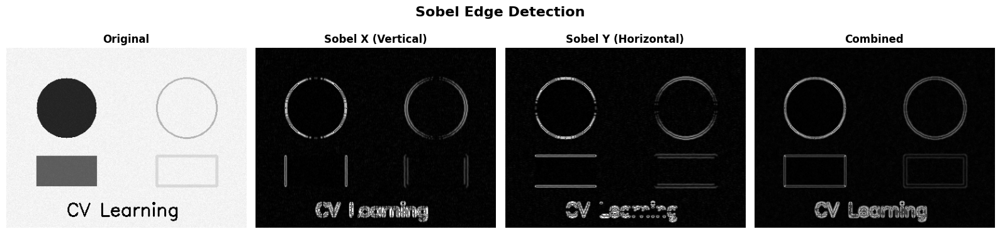

2. LAPLACIAN EDGE DETECTION



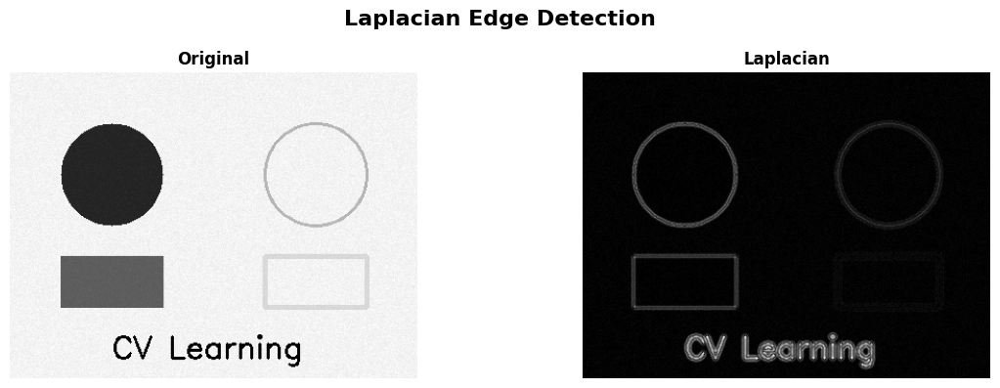

3. CANNY EDGE DETECTION



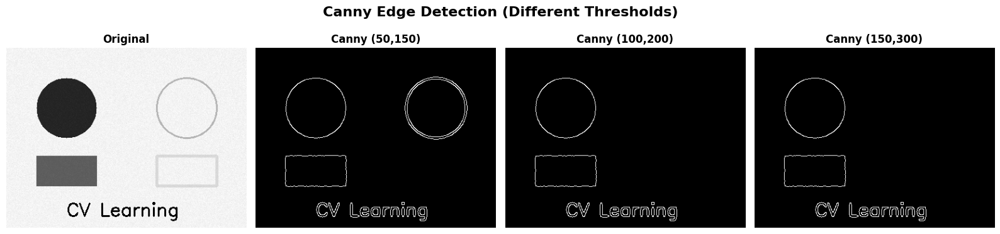


COMPARISON OF EDGE DETECTION METHODS:
Sobel: Fast, good for strong edges, sensitive to noise
Laplacian: Second derivative, detects all changes
Canny: Advanced, best quality edges, slower computation


In [ ]:


print("EDGE DETECTION METHODS\n")

# Prepare image (blur first to reduce noise)
blurred = cv2.GaussianBlur(gray, (5, 5), 1)

# 1. Sobel Edge Detection
print("1. SOBEL EDGE DETECTION\n")

sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)  # Vertical edges
sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)  # Horizontal edges

# Convert to uint8 for display
sobel_x = np.uint8(np.absolute(sobel_x))
sobel_y = np.uint8(np.absolute(sobel_y))

# Combine X and Y gradients
sobel_combined = cv2.addWeighted(sobel_x, 0.5, sobel_y, 0.5, 0)

show_images_comparison(
    "Sobel Edge Detection",
    [gray, sobel_x, sobel_y, sobel_combined],
    ["Original", "Sobel X (Vertical)", "Sobel Y (Horizontal)", "Combined"],
    figsize=(16, 4)
)

# 2. Laplacian Edge Detection
print("2. LAPLACIAN EDGE DETECTION\n")

laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))

show_images_comparison(
    "Laplacian Edge Detection",
    [gray, laplacian],
    ["Original", "Laplacian"],
    figsize=(12, 4)
)

# 3. Canny Edge Detection (Most Popular)
print("3. CANNY EDGE DETECTION\n")

# Different threshold values
canny_50_150 = cv2.Canny(blurred, 50, 150)
canny_100_200 = cv2.Canny(blurred, 100, 200)
canny_150_300 = cv2.Canny(blurred, 150, 300)

show_images_comparison(
    "Canny Edge Detection (Different Thresholds)",
    [gray, canny_50_150, canny_100_200, canny_150_300],
    ["Original", "Canny (50,150)", "Canny (100,200)", "Canny (150,300)"],
    figsize=(16, 4)
)

print("\nCOMPARISON OF EDGE DETECTION METHODS:")
print("Sobel: Fast, good for strong edges, sensitive to noise")
print("Laplacian: Second derivative, detects all changes")
print("Canny: Advanced, best quality edges, slower computation")

---

## PART 5: THRESHOLDING & BINARY IMAGES

### Theory: Segmentation Using Thresholds

THEORY: THRESHOLDING

1. GLOBAL THRESHOLDING:
   - All pixels > threshold = White (255)
   - All pixels <= threshold = Black (0)
   - Simple but effective for high-contrast images
   
2. ADAPTIVE THRESHOLDING:
   - Threshold varies across image
   - Each pixel compared to local neighborhood
   - Better for images with varying lighting
   
3. OTSU'S METHOD:
   - Automatically finds optimal threshold
   - Minimizes within-class variance
   - No manual threshold selection needed
   
4. USE CASES:
   - Document scanning
   - OCR preprocessing
   - Object segmentation
   - Foreground-background separation

THRESHOLDING METHODS

1. GLOBAL THRESHOLDING



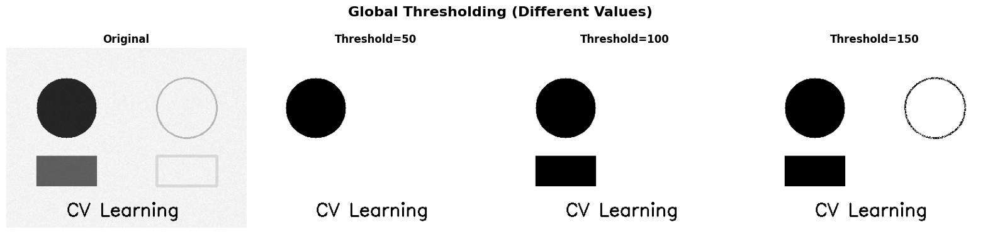

2. OTSU'S AUTOMATIC THRESHOLDING

Optimal Threshold Value (Otsu): 83.0


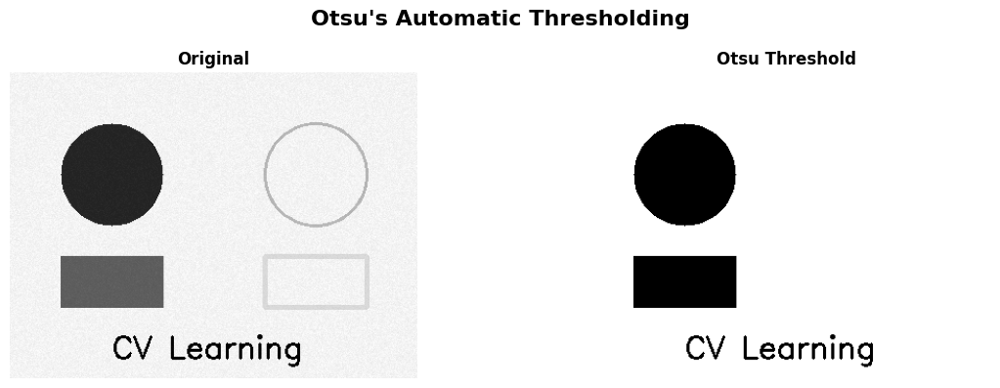

3. ADAPTIVE THRESHOLDING



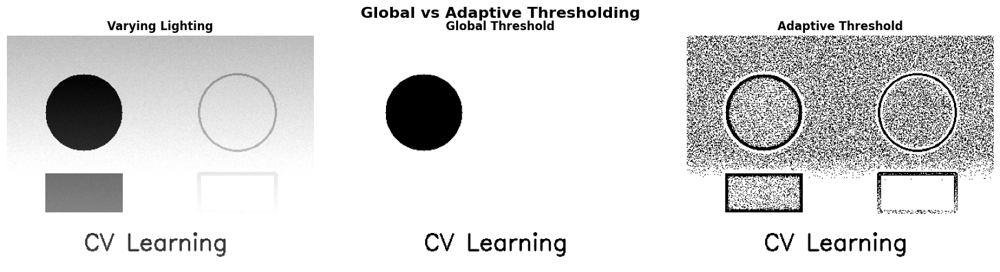

4. THRESHOLD VARIANTS



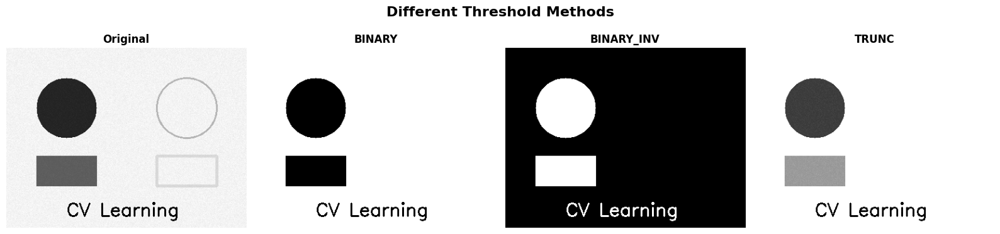

In [ ]:
print("THRESHOLDING METHODS\n")

# 1. Simple Global Threshold
print("1. GLOBAL THRESHOLDING\n")

thresh_50 = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)[1]
thresh_100 = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)[1]
thresh_150 = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY)[1]

show_images_comparison(
    "Global Thresholding (Different Values)",
    [gray, thresh_50, thresh_100, thresh_150],
    ["Original", "Threshold=50", "Threshold=100", "Threshold=150"],
    figsize=(16, 4)
)

# 2. Otsu's Method (Automatic)
print("2. OTSU'S AUTOMATIC THRESHOLDING\n")

otsu_val, thresh_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Optimal Threshold Value (Otsu): {otsu_val}")

show_images_comparison(
    "Otsu's Automatic Thresholding",
    [gray, thresh_otsu],
    ["Original", "Otsu Threshold"],
    figsize=(12, 4)
)

# 3. Adaptive Thresholding (for varying lighting)
print("3. ADAPTIVE THRESHOLDING\n")

# Create an image with varying lighting for demonstration
# Convert to float32 for arithmetic operations to avoid issues with uint8 overflow/underflow
varying_light_float = gray.copy().astype(np.float32)

for i in range(varying_light_float.shape[0]):
    # Calculate the brightness to add for this row
    brightness_add = (i / varying_light_float.shape[0] * 100)
    # Add the brightness to the current row
    varying_light_float[i, :] += brightness_add # Apply brightness to all columns in the row

# Clip values to 0-255 and convert back to uint8
varying_light = np.clip(varying_light_float, 0, 255).astype(np.uint8)

global_thresh = cv2.threshold(varying_light, 127, 255, cv2.THRESH_BINARY)[1]
adaptive_thresh = cv2.adaptiveThreshold(
    varying_light, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
)

show_images_comparison(
    "Global vs Adaptive Thresholding",
    [varying_light, global_thresh, adaptive_thresh],
    ["Varying Lighting", "Global Threshold", "Adaptive Threshold"],
    figsize=(15, 4)
)

# 4. Inverse Threshold
print("4. THRESHOLD VARIANTS\n")

thresh_binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]
thresh_binary_inv = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)[1]
thresh_trunc = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)[1]
thresh_tozero = cv2.threshold(gray, 127, 255, cv2.THRESH_TOZERO)[1]

show_images_comparison(
    "Different Threshold Methods",
    [gray, thresh_binary, thresh_binary_inv, thresh_trunc],
    ["Original", "BINARY", "BINARY_INV", "TRUNC"],
    figsize=(16, 4)
)


---

## PART 6: CONTOURS & SHAPE ANALYSIS

### Theory: Finding and Analyzing Object Boundaries

THEORY: CONTOURS

1. WHAT ARE CONTOURS?
   - Curves/outlines of objects in binary images
   - Continuous points along object boundaries
   - Essential for object detection and analysis
   
2. HOW TO FIND CONTOURS:
   - Requires binary image (black & white)
   - cv2.findContours() returns list of contours
   - Each contour: series of (x,y) coordinates
   
3. CONTOUR PROPERTIES:
   - Area: Total pixels inside contour (cv2.contourArea)
   - Perimeter: Arc length (cv2.arcLength)
   - Centroid: Center of mass
   - Bounding Rectangle: Smallest rectangle containing contour
   - Moments: Mathematical properties for shape analysis
   
4. CONTOUR APPROXIMATION:
   - CHAIN_APPROX_NONE: All boundary points
   - CHAIN_APPROX_SIMPLE: Compressed version (fewer points)

CONTOUR DETECTION & ANALYSIS

Number of contours found: 1

1. DRAWING CONTOURS



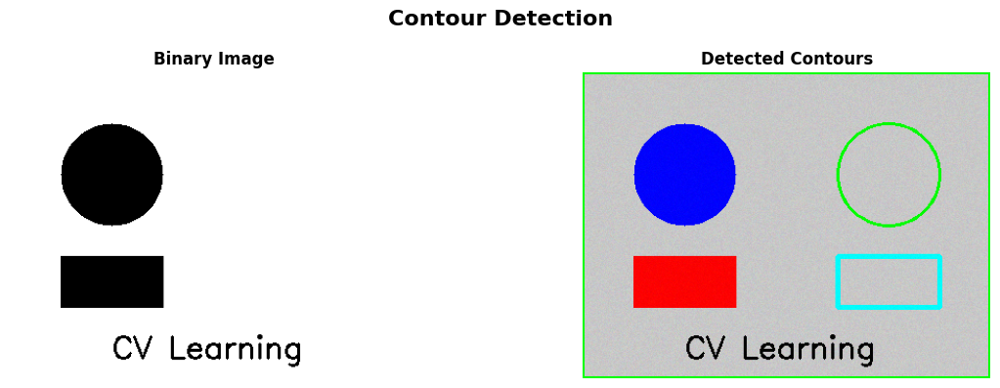

2. CONTOUR PROPERTIES ANALYSIS

Contour 0:
  Area: 119301.00 pixels²
  Perimeter: 1396.00 pixels
  Vertices: 4
  Circularity: 0.769
  Centroid: (199, 149)

3. DRAWING BOUNDING BOXES



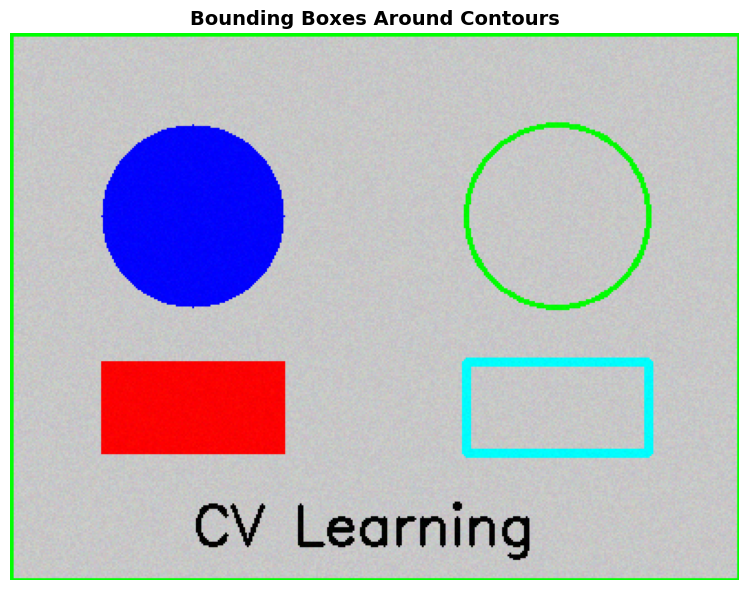

4. FITTING GEOMETRIC SHAPES



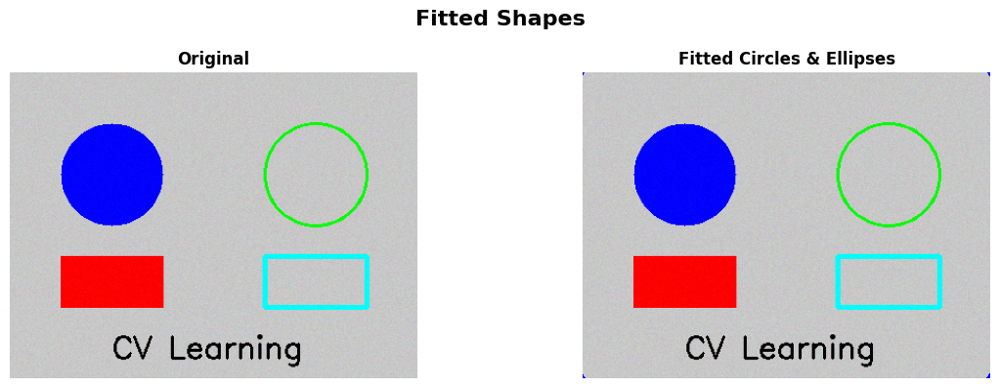

In [ ]:
print("CONTOUR DETECTION & ANALYSIS\n")

# Create a binary image for contour detection
binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]

# Find contours
contours, hierarchy = cv2.findContours(
    binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

print(f"Number of contours found: {len(contours)}\n")

# 1. Draw all contours
print("1. DRAWING CONTOURS\n")

img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 2)

show_images_comparison(
    "Contour Detection",
    [binary, img_contours],
    ["Binary Image", "Detected Contours"],
    figsize=(12, 4)
)

# 2. Analyze contour properties
print("2. CONTOUR PROPERTIES ANALYSIS\n")

contour_data = []
for i, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)

    # Skip very small contours
    if area < 100:
        continue

    perimeter = cv2.arcLength(cnt, True)
    epsilon = 0.02 * perimeter
    approx = cv2.approxPolyDP(cnt, epsilon, True)

    # Get bounding rectangle
    x, y, w, h = cv2.boundingRect(cnt)

    # Get moments for centroid
    M = cv2.moments(cnt)
    if M["m00"] > 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = x, y

    # Circularity
    circularity = 4 * np.pi * area / (perimeter ** 2) if perimeter > 0 else 0

    contour_data.append({
        'contour_id': i,
        'area': area,
        'perimeter': perimeter,
        'vertices': len(approx),
        'x': x, 'y': y, 'width': w, 'height': h,
        'centroid': (cx, cy),
        'circularity': circularity
    })

    print(f"Contour {i}:")
    print(f"  Area: {area:.2f} pixels²")
    print(f"  Perimeter: {perimeter:.2f} pixels")
    print(f"  Vertices: {len(approx)}")
    print(f"  Circularity: {circularity:.3f}")
    print(f"  Centroid: ({cx}, {cy})")
    print()

# 3. Draw bounding boxes
print("3. DRAWING BOUNDING BOXES\n")

img_bbox = img.copy()
for contour in contours:
    if cv2.contourArea(contour) < 100:
        continue
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img_bbox, (x, y), (x+w, y+h), (0, 255, 0), 2)

show_image("Bounding Boxes Around Contours", img_bbox)

# 4. Draw fitted circles (if possible)
print("4. FITTING GEOMETRIC SHAPES\n")

img_shapes = img.copy()
for contour in contours:
    area = cv2.contourArea(contour)
    if area < 100:
        continue

    # Fit circle
    (x, y), radius = cv2.minEnclosingCircle(contour)
    center = (int(x), int(y))
    radius = int(radius)
    cv2.circle(img_shapes, center, radius, (255, 0, 0), 2)

    # Fit ellipse (if possible)
    if len(contour) >= 5:
        ellipse = cv2.fitEllipse(contour)
        cv2.ellipse(img_shapes, ellipse, (0, 0, 255), 2)

show_images_comparison(
    "Fitted Shapes",
    [img, img_shapes],
    ["Original", "Fitted Circles & Ellipses"],
    figsize=(12, 4)
)

---

## PART 7: TRANSFORMATIONS & GEOMETRY

### Theory: Image Geometric Operations

THEORY: GEOMETRIC TRANSFORMATIONS

1. SCALING/RESIZING:
   - Change image dimensions
   - Interpolation methods:
     - INTER_NEAREST: Fastest, lower quality
     - INTER_LINEAR: Good balance (default)
     - INTER_CUBIC: Better quality, slower
     - INTER_AREA: Best for downsampling

2. ROTATION:
   - Rotate image by angle around center
   - Need rotation matrix and center point

3. AFFINE TRANSFORMATION:
   - Transform using 3 source and 3 destination points
   - 2x3 transformation matrix
   - Preserves parallel lines (sort of)

4. PERSPECTIVE TRANSFORMATION:
   - Transform using 4 pairs of points
   - 3x3 transformation matrix
   - Can correct viewing angles

5. TRANSLATION (SHIFTING):
   - Move image by (tx, ty) pixels
   - Done with transformation matrix

GEOMETRIC TRANSFORMATIONS

1. IMAGE RESIZING



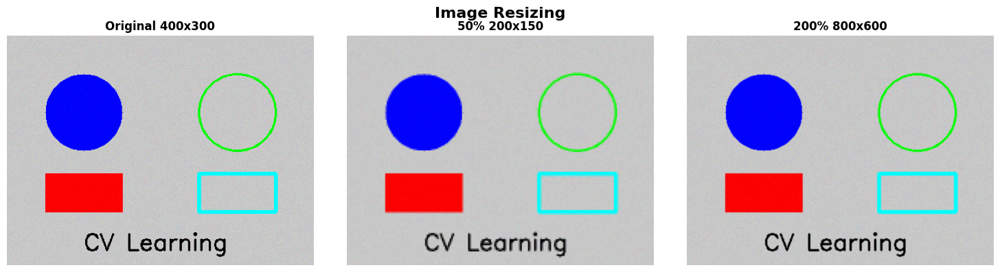

2. IMAGE TRANSLATION



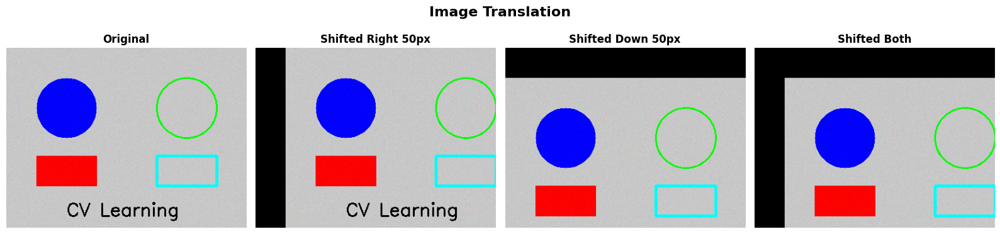

3. IMAGE ROTATION



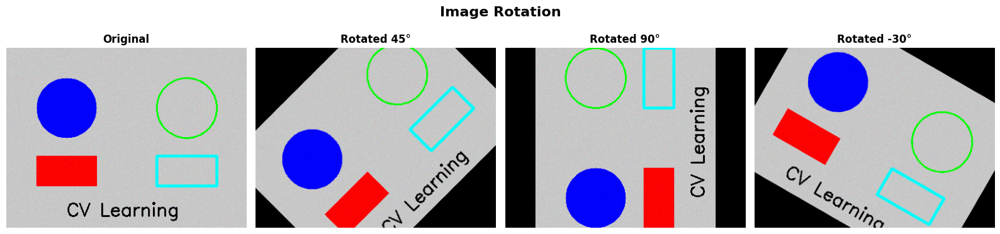

4. IMAGE FLIPPING



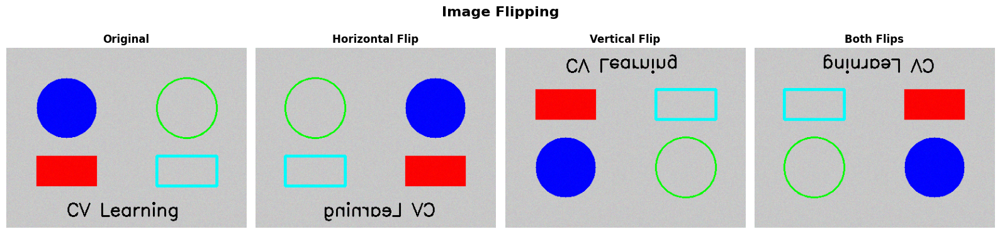

5. IMAGE CROPPING



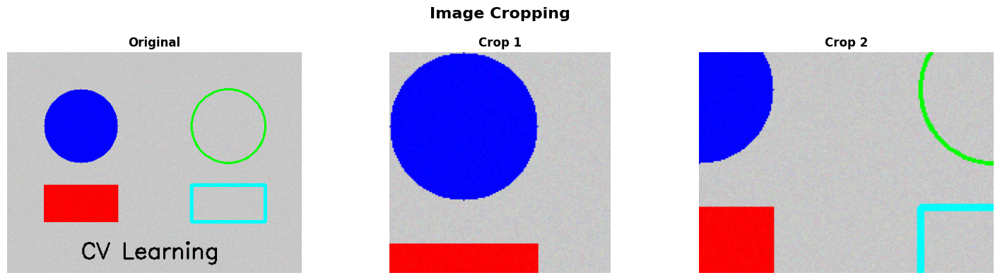

6. AFFINE TRANSFORMATION



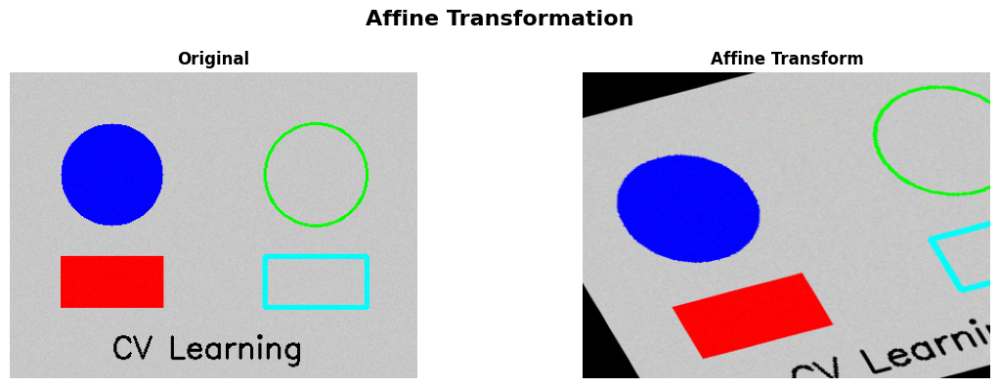

In [ ]:
print("GEOMETRIC TRANSFORMATIONS\n")

# 1. Scaling/Resizing
print("1. IMAGE RESIZING\n")

small = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)  # 50% of original
large = cv2.resize(img, (0, 0), fx=2, fy=2)      # 200% of original

show_images_comparison(
    "Image Resizing",
    [img, small, large],
    [f"Original {img.shape[1]}x{img.shape[0]}",
     f"50% {small.shape[1]}x{small.shape[0]}",
     f"200% {large.shape[1]}x{large.shape[0]}"],
    figsize=(15, 4)
)

# 2. Translation (Shifting)
print("2. IMAGE TRANSLATION\n")

def translate_image(img, tx, ty):
    """Shift image by (tx, ty) pixels"""
    h, w = img.shape[:2]
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    return cv2.warpAffine(img, M, (w, h))

shifted_right = translate_image(img, 50, 0)
shifted_down = translate_image(img, 0, 50)
shifted_both = translate_image(img, 50, 50)

show_images_comparison(
    "Image Translation",
    [img, shifted_right, shifted_down, shifted_both],
    ["Original", "Shifted Right 50px", "Shifted Down 50px", "Shifted Both"],
    figsize=(16, 4)
)

# 3. Rotation
print("3. IMAGE ROTATION\n")

def rotate_image(img, angle):
    """Rotate image by angle (degrees, counter-clockwise)"""
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, M, (w, h))

rot_45 = rotate_image(img, 45)
rot_90 = rotate_image(img, 90)
rot_neg30 = rotate_image(img, -30)

show_images_comparison(
    "Image Rotation",
    [img, rot_45, rot_90, rot_neg30],
    ["Original", "Rotated 45°", "Rotated 90°", "Rotated -30°"],
    figsize=(16, 4)
)

# 4. Flipping
print("4. IMAGE FLIPPING\n")

flip_h = cv2.flip(img, 1)    # Flip horizontally (1)
flip_v = cv2.flip(img, 0)    # Flip vertically (0)
flip_both = cv2.flip(img, -1) # Flip both (-1)

show_images_comparison(
    "Image Flipping",
    [img, flip_h, flip_v, flip_both],
    ["Original", "Horizontal Flip", "Vertical Flip", "Both Flips"],
    figsize=(16, 4)
)

# 5. Cropping (slicing)
print("5. IMAGE CROPPING\n")

h, w = img.shape[:2]
crop1 = img[50:200, 50:200]        # Top-left region
crop2 = img[h//4:3*h//4, w//4:3*w//4]  # Center region

show_images_comparison(
    "Image Cropping",
    [img, crop1, crop2],
    ["Original", "Crop 1", "Crop 2"],
    figsize=(15, 4)
)

# 6. Affine Transformation
print("6. AFFINE TRANSFORMATION\n")

# Define 3 source points and 3 destination points
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])

M = cv2.getAffineTransform(pts1, pts2)
affine = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

show_images_comparison(
    "Affine Transformation",
    [img, affine],
    ["Original", "Affine Transform"],
    figsize=(12, 4)
)

---

## PART 8: MORPHOLOGICAL OPERATIONS

### Theory: Shape Modification

THEORY: MORPHOLOGICAL OPERATIONS

1. EROSION:
   - Removes pixels from object boundaries
   - Shrinks objects, fills small holes
   - Good for removing small noise
   
2. DILATION:
   - Adds pixels to object boundaries
   - Expands objects, fills gaps
   - Good for connecting nearby objects
   
3. OPENING (Erosion → Dilation):
   - Removes small noise while preserving object size
   - Opens small gaps
   
4. CLOSING (Dilation → Erosion):
   - Fills small holes in objects
   - Closes small gaps
   
5. MORPHOLOGICAL GRADIENT:
   - Dilation - Erosion
   - Shows object outline
   
6. KERNELS:
   - Define neighborhood for operations
   - Common types: MORPH_RECT, MORPH_ELLIPSE, MORPH_CROSS

MORPHOLOGICAL OPERATIONS

1. EROSION



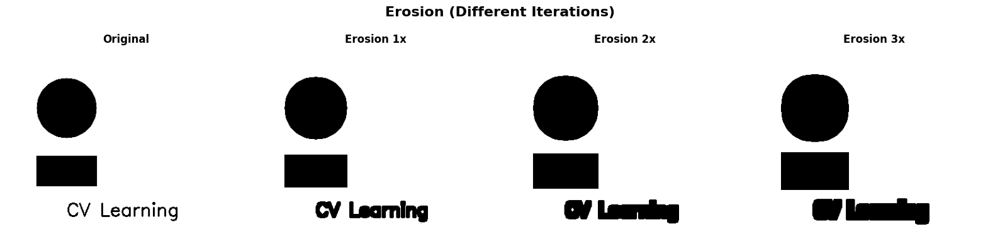

2. DILATION



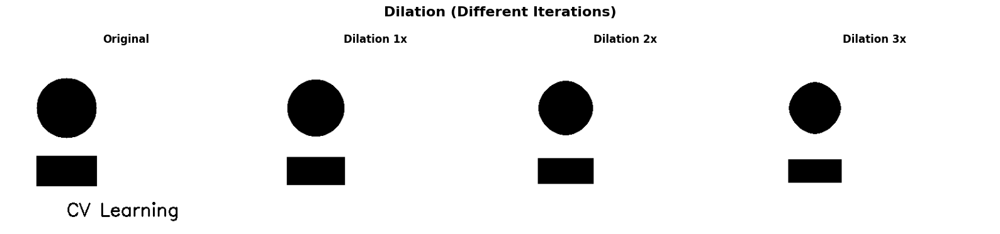

3. OPENING (Remove small noise)



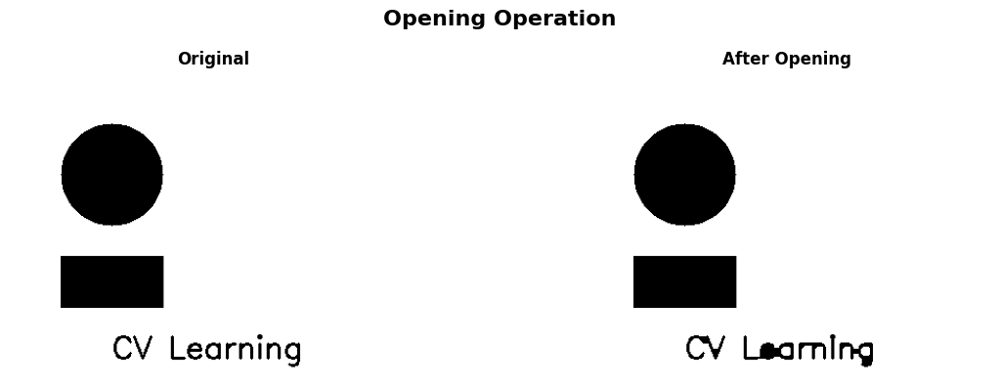

4. CLOSING (Fill small holes)



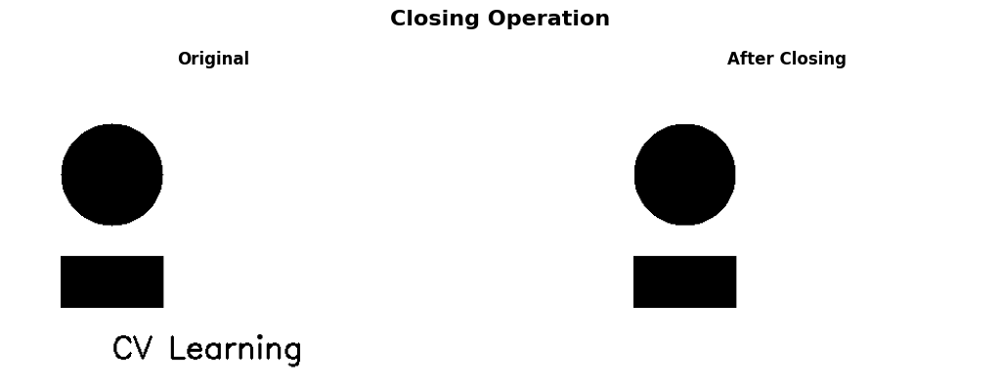

5. MORPHOLOGICAL GRADIENT



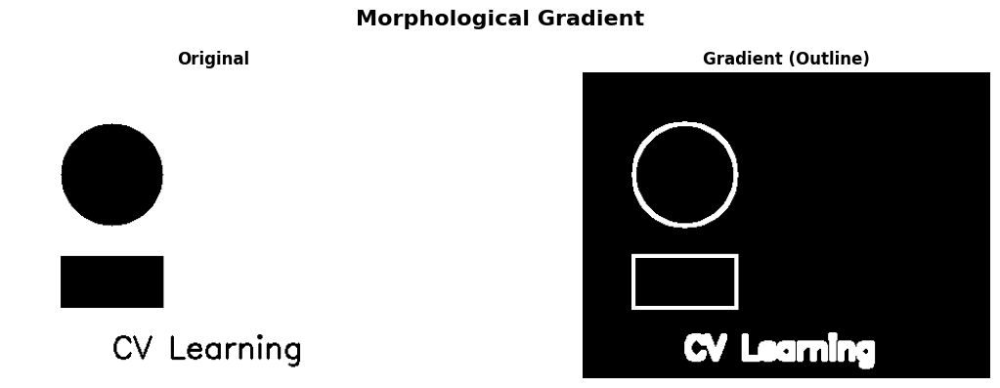

6. DIFFERENT KERNEL SHAPES



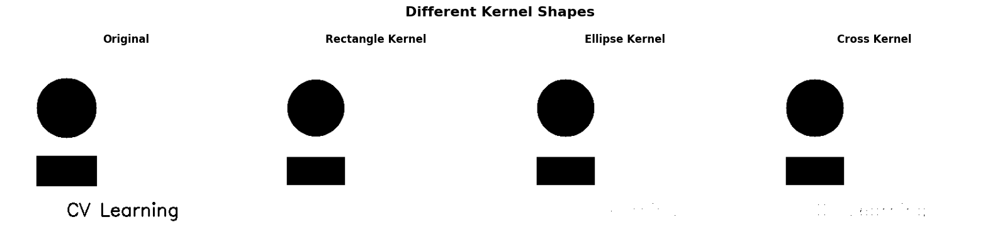

In [ ]:
print("MORPHOLOGICAL OPERATIONS\n")

# Create kernel
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

# 1. Erosion
print("1. EROSION\n")

eroded_1 = cv2.erode(binary, kernel, iterations=1)
eroded_2 = cv2.erode(binary, kernel, iterations=2)
eroded_3 = cv2.erode(binary, kernel, iterations=3)

show_images_comparison(
    "Erosion (Different Iterations)",
    [binary, eroded_1, eroded_2, eroded_3],
    ["Original", "Erosion 1x", "Erosion 2x", "Erosion 3x"],
    figsize=(16, 4)
)

# 2. Dilation
print("2. DILATION\n")

dilated_1 = cv2.dilate(binary, kernel, iterations=1)
dilated_2 = cv2.dilate(binary, kernel, iterations=2)
dilated_3 = cv2.dilate(binary, kernel, iterations=3)

show_images_comparison(
    "Dilation (Different Iterations)",
    [binary, dilated_1, dilated_2, dilated_3],
    ["Original", "Dilation 1x", "Dilation 2x", "Dilation 3x"],
    figsize=(16, 4)
)

# 3. Opening (Erosion → Dilation)
print("3. OPENING (Remove small noise)\n")

opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

show_images_comparison(
    "Opening Operation",
    [binary, opened],
    ["Original", "After Opening"],
    figsize=(12, 4)
)

# 4. Closing (Dilation → Erosion)
print("4. CLOSING (Fill small holes)\n")

closed = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

show_images_comparison(
    "Closing Operation",
    [binary, closed],
    ["Original", "After Closing"],
    figsize=(12, 4)
)

# 5. Gradient (Dilation - Erosion)
print("5. MORPHOLOGICAL GRADIENT\n")

gradient = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT, kernel)

show_images_comparison(
    "Morphological Gradient",
    [binary, gradient],
    ["Original", "Gradient (Outline)"],
    figsize=(12, 4)
)

# 6. Different kernel shapes
print("6. DIFFERENT KERNEL SHAPES\n")

kernel_rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
kernel_ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
kernel_cross = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))

dilate_rect = cv2.dilate(binary, kernel_rect, iterations=1)
dilate_ellipse = cv2.dilate(binary, kernel_ellipse, iterations=1)
dilate_cross = cv2.dilate(binary, kernel_cross, iterations=1)

show_images_comparison(
    "Different Kernel Shapes",
    [binary, dilate_rect, dilate_ellipse, dilate_cross],
    ["Original", "Rectangle Kernel", "Ellipse Kernel", "Cross Kernel"],
    figsize=(16, 4)
)

---

## PART 9: COMPLETE PROJECT - IMAGE ANALYZER

### Building a Complete Computer Vision Pipeline

COMPLETE PROJECT: IMAGE ANALYZER

This combines all concepts learned:
1. Load and preprocess image
2. Convert to grayscale
3. Apply edge detection
4. Find contours
5. Analyze and draw results

Real-world use case:
- Document scanning
- Quality control inspection
- Object counting
- Feature extraction

COMPLETE PROJECT: IMAGE ANALYZER TOOL


Running Image Analyzer...

Image loaded: 400x300
Otsu threshold value: 125.0
Contours detected: 1

ANALYSIS SUMMARY
Total objects detected: 1

Object Details:
------------------------------------------------------------

Object 0:
  Shape Type: Unknown
  Area: 119301.00 pixels²
  Perimeter: 1396.00 pixels
  Circularity: 0.769
  Aspect Ratio: 1.333
  Centroid: (199, 149)
  Bounding Box: (0, 0, 400, 300)


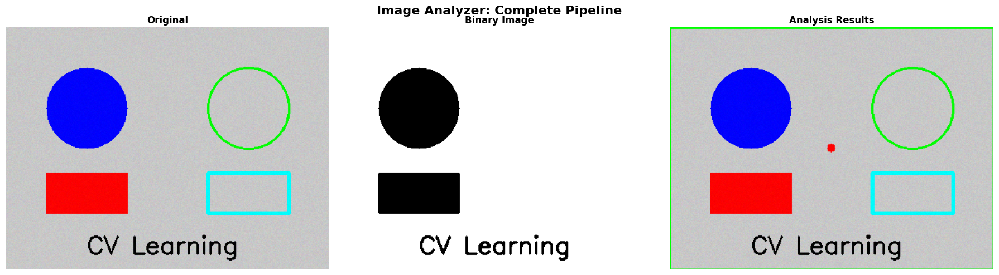


✓ Image analysis complete!


In [ ]:
print("="*60)
print("COMPLETE PROJECT: IMAGE ANALYZER TOOL")
print("="*60 + "\n")

class ImageAnalyzer:
    """
    Complete image analysis pipeline using computer vision
    """

    def __init__(self, image_path=None, image_bgr=None):
        """
        Initialize analyzer with either file path or BGR image
        """
        if image_path:
            self.image = cv2.imread(image_path)
        else:
            self.image = image_bgr

        if self.image is None:
            raise ValueError("Image not loaded successfully")

        self.original = self.image.copy()
        self.gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
        self.height, self.width = self.gray.shape

        print(f"Image loaded: {self.width}x{self.height}")

    def preprocess(self, blur_size=5, threshold_value=None):
        """
        Preprocess image: denoise and threshold
        """
        # Blur to reduce noise
        blurred = cv2.GaussianBlur(self.gray, (blur_size, blur_size), 1)

        # Automatic threshold using Otsu if not specified
        if threshold_value is None:
            threshold_value, self.binary = cv2.threshold(
                blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
            )
            print(f"Otsu threshold value: {threshold_value}")
        else:
            _, self.binary = cv2.threshold(blurred, threshold_value, 255, cv2.THRESH_BINARY)

        return self.binary

    def detect_contours(self, min_area=100):
        """
        Detect and filter contours
        """
        contours, _ = cv2.findContours(
            self.binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )

        # Filter by minimum area
        self.contours = [c for c in contours if cv2.contourArea(c) > min_area]
        print(f"Contours detected: {len(self.contours)}")

        return self.contours

    def analyze_objects(self):
        """
        Extract properties of detected objects
        """
        self.objects = []

        for i, contour in enumerate(self.contours):
            # Basic properties
            area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)

            # Shape approximation
            epsilon = 0.02 * perimeter
            approx = cv2.approxPolyDP(contour, epsilon, True)

            # Bounding box
            x, y, w, h = cv2.boundingRect(contour)

            # Centroid
            M = cv2.moments(contour)
            cx = int(M["m10"] / M["m00"]) if M["m00"] > 0 else x
            cy = int(M["m01"] / M["m00"]) if M["m00"] > 0 else y

            # Circularity (how close to perfect circle)
            circularity = 4 * np.pi * area / (perimeter ** 2) if perimeter > 0 else 0

            # Aspect ratio
            aspect_ratio = float(w) / h if h > 0 else 0

            # Object classification
            if circularity > 0.8:
                shape_type = "Circle"
            elif aspect_ratio > 2:
                shape_type = "Rectangle (Wide)"
            elif aspect_ratio < 0.5:
                shape_type = "Rectangle (Tall)"
            elif len(approx) > 5:
                shape_type = "Polygon"
            else:
                shape_type = "Unknown"

            self.objects.append({
                'id': i,
                'contour': contour,
                'area': area,
                'perimeter': perimeter,
                'centroid': (cx, cy),
                'bbox': (x, y, w, h),
                'circularity': circularity,
                'aspect_ratio': aspect_ratio,
                'shape': shape_type,
                'vertices': len(approx)
            })

        return self.objects

    def draw_analysis(self):
        """
        Draw analysis results on image
        """
        result = self.original.copy()

        for obj in self.objects:
            x, y, w, h = obj['bbox']
            cx, cy = obj['centroid']

            # Draw bounding box (green)
            cv2.rectangle(result, (x, y), (x+w, y+h), (0, 255, 0), 2)

            # Draw centroid (red)
            cv2.circle(result, (cx, cy), 5, (0, 0, 255), -1)

            # Add label
            label = f"{obj['shape']} (A:{obj['area']:.0f})"
            cv2.putText(result, label, (x, y-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        return result

    def print_summary(self):
        """
        Print summary of analysis
        """
        print("\n" + "="*60)
        print("ANALYSIS SUMMARY")
        print("="*60)
        print(f"Total objects detected: {len(self.objects)}")
        print("\nObject Details:")
        print("-" * 60)

        for obj in self.objects:
            print(f"\nObject {obj['id']}:")
            print(f"  Shape Type: {obj['shape']}")
            print(f"  Area: {obj['area']:.2f} pixels²")
            print(f"  Perimeter: {obj['perimeter']:.2f} pixels")
            print(f"  Circularity: {obj['circularity']:.3f}")
            print(f"  Aspect Ratio: {obj['aspect_ratio']:.3f}")
            print(f"  Centroid: {obj['centroid']}")
            print(f"  Bounding Box: {obj['bbox']}")

# Use the analyzer
print("\nRunning Image Analyzer...\n")

analyzer = ImageAnalyzer(image_bgr=img)
analyzer.preprocess(blur_size=5)
analyzer.detect_contours(min_area=100)
analyzer.analyze_objects()
analyzer.print_summary()

# Visualize results
result_image = analyzer.draw_analysis()

show_images_comparison(
    "Image Analyzer: Complete Pipeline",
    [img, analyzer.binary, analyzer.draw_analysis()],
    ["Original", "Binary Image", "Analysis Results"],
    figsize=(18, 5)
)

print("\n✓ Image analysis complete!")

---

## PART 10: BONUS - FACE DETECTION

### Using Pre-trained Haar Cascade Classifiers

BONUS: FACE DETECTION

Haar Cascade is a classical machine learning approach:
- Pre-trained classifier specifically for detecting faces
- Uses Haar-like features (simple rectangular patterns)
- Fast and works well for frontal faces
- Included with OpenCV

Limitations:
- Best for frontal faces
- Less effective for tilted or partially visible faces
- Lower accuracy than modern deep learning methods
- But excellent for learning and quick prototyping

FACE DETECTION WITH HAAR CASCADES

Haar cascade already present
Attempting face detection...
Note: This works best with actual face images

Faces detected: 0


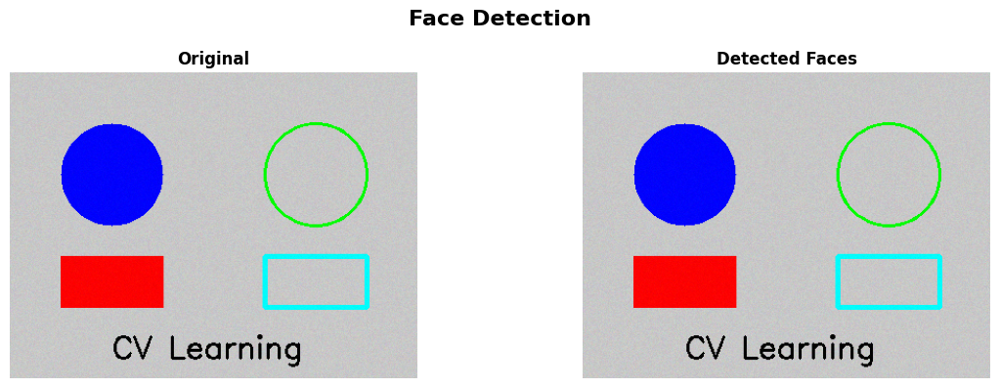


Haar Cascade Advantages:
✓ Fast computation
✓ Pre-trained models available
✓ Good for real-time detection
✓ Low memory footprint

Haar Cascade Limitations:
✗ Only works well for frontal faces
✗ Sensitive to lighting conditions
✗ Can have false positives
✗ Less accurate than deep learning methods


In [ ]:
print("FACE DETECTION WITH HAAR CASCADES\n")

import os
import urllib.request

# Download Haar cascade if not present
cascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"
cascade_path = "haarcascade_frontalface_default.xml"

if not os.path.exists(cascade_path):
    print("Downloading Haar cascade classifier...")
    urllib.request.urlretrieve(cascade_url, cascade_path)
    print("Downloaded!")
else:
    print("Haar cascade already present")

# Load cascade
face_cascade = cv2.CascadeClassifier(cascade_path)

def detect_faces_in_image(image_bgr):
    """
    Detect faces in image using Haar Cascade
    """
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,      # How much the image size is reduced
        minNeighbors=5,       # Quality of detection (higher = fewer false positives)
        minSize=(30, 30),     # Minimum face size
        maxSize=(300, 300)    # Maximum face size
    )

    # Draw rectangles around faces
    result = image_bgr.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(result, (x, y), (x+w, y+h), (255, 0, 0), 3)
        cv2.putText(result, "Face", (x, y-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    return result, faces

# Create test image with a face-like pattern
test_image = img.copy()

print("Attempting face detection...")
print("Note: This works best with actual face images\n")

result_face, detected_faces = detect_faces_in_image(test_image)
print(f"Faces detected: {len(detected_faces)}")

for i, (x, y, w, h) in enumerate(detected_faces):
    print(f"Face {i}: Position=({x},{y}), Size={w}x{h}")

show_images_comparison(
    "Face Detection",
    [test_image, result_face],
    ["Original", "Detected Faces"],
    figsize=(12, 4)
)

print("\nHaar Cascade Advantages:")
print("✓ Fast computation")
print("✓ Pre-trained models available")
print("✓ Good for real-time detection")
print("✓ Low memory footprint")

print("\nHaar Cascade Limitations:")
print("✗ Only works well for frontal faces")
print("✗ Sensitive to lighting conditions")
print("✗ Can have false positives")
print("✗ Less accurate than deep learning methods")

---

## INTERACTIVE PRACTICE EXERCISE

INTERACTIVE PRACTICE: BUILD YOUR OWN FILTER

Challenge: Create a custom image filter combining everything learned

PRACTICE EXERCISE: CREATE YOUR OWN FILTER



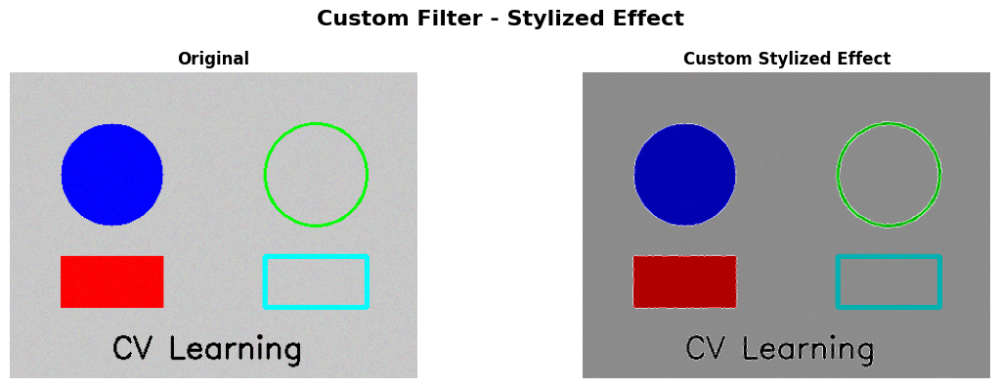

Try modifying the custom_image_filter() function to:
- Change filter parameters
- Add more processing steps
- Combine different techniques


In [ ]:
print("PRACTICE EXERCISE: CREATE YOUR OWN FILTER\n")

def custom_image_filter(image_bgr):
    """
    Create a custom filter combining multiple techniques
    This example creates a "stylized" effect
    """
    # Step 1: Convert to grayscale
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # Step 2: Apply bilateral filter (preserve edges, smooth colors)
    bilateral = cv2.bilateralFilter(image_bgr, 9, 75, 75)

    # Step 3: Detect edges
    edges = cv2.Canny(gray, 100, 200)
    edges_3ch = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    # Step 4: Combine
    result = cv2.addWeighted(bilateral, 0.7, edges_3ch, 0.3, 0)

    return result

custom_result = custom_image_filter(img)

show_images_comparison(
    "Custom Filter - Stylized Effect",
    [img, custom_result],
    ["Original", "Custom Stylized Effect"],
    figsize=(12, 4)
)

print("Try modifying the custom_image_filter() function to:")
print("- Change filter parameters")
print("- Add more processing steps")
print("- Combine different techniques")

1. DEBUGGING TIPS:
   - Always visualize intermediate results
   - Use print() to check image properties
   - Start with simple images before complex ones
   
2. OPTIMIZATION:
   - Resize large images for faster processing
   - Use grayscale when color not needed
   - Adjust parameters for speed/accuracy trade-off
   
3. COMMON ISSUES:
   - BGR vs RGB confusion: Always remember OpenCV uses BGR
   - Image channels: Check shape before operations
   - Data types: Some functions require uint8, others need float32
   
4. BEST PRACTICES:
   - Always make a copy before modifying
   - Use descriptive variable names
   - Comment your code
   - Test on multiple images
   
5. PERFORMANCE:
   - Gaussian blur: ~5x5 kernel is usually sufficient
   - Canny: Thresholds (100, 200) work for most cases
   - Morphological: 1-3 iterations usually enough
   
6. LEARNING RESOURCES:
   - OpenCV Official Docs: docs.opencv.org
   - ImageProcessing Tutorials: tutorials.opencv.org
   - Kaggle Datasets: kaggle.com/datasets
   - YouTube Channels: OpenCV tutorials

```

QUICK CONFIGURATION GUIDE:

For CRISP edges:
├─ Gaussian Blur: (5,5) or (7,7)
├─ Canny Thresholds: (100, 200) or (50, 150)
└─ Morphology: Open then Close

For SMOOTH blurring:
├─ Bilateral Filter: (9, 75, 75)
├─ Gaussian Blur: (15, 15) or (21, 21)
└─ Median Blur: (5, 5) or (7, 7)

For SHAPE detection:
├─ Threshold: OTSU automatic
├─ Morphology: Close operation (fill gaps)
└─ Contours: RETR_EXTERNAL + CHAIN_APPROX_SIMPLE

For DOCUMENT scanning:
├─ Threshold: Otsu's method
├─ Morphology: Open operation (remove noise)
├─ Perspective: 4-point transform
└─ Dilation: Fill small gaps

```
